# Master Fig 3

In [1]:
library(ggplot2)
library(patchwork)

In [2]:
DAYS = c("D0", "D2", "D4", "D6", "D8", "D10", "D12", "D14")

## Load Subfigs

In [20]:
# peak_set_heatmap = readRDS("./subfigs/20200713_peak_set_heatmap.rds")
# peak_assignments = readRDS("./subfigs/20200713_peak_set_heatmap_peak_assignments.rds") # need to be loaded for making heatmap

In [13]:
gridmap = readRDS("./subfigs/20200926_gridmap.rds")

In [33]:
# locus = readRDS("./subfigs/20200713_locus.rds")

In [114]:
# go_terms = readRDS("./subfigs/20200713_go_terms.rds")

In [56]:
vortex = readRDS("./subfigs/20200926_vortex.rds")

In [44]:
p2g_go = readRDS("./subfigs/20200926_peak_to_gene_GO.rds")
peak_assignments_with_link = readRDS("./subfigs/20200926_peak_assignments_with_link.rds") # need to be loaded for making heatmap

### Configs

In [5]:
cluster_config = read.table("../configs/cluster.tsv", comment.char = '', header=T, sep='\t')
cluster_config$colour = as.character(cluster_config$colour)
cluster_config$description = as.character(cluster_config$description)

rownames(cluster_config) = cluster_config$cluster
cluster_config

,cluster,colour,description,new_cluster
,<int>,<chr>,<chr>,<int>
1,1,#F4D5CD,Intermediate,12
2,2,#78A824,Pre-iPSC,15
3,3,#F01D35,Fibroblast-like,5
4,4,#E85F6D,Fibroblast-like,3
5,5,#B03743,Fibroblast,1
6,6,#7C2730,Fibroblast,2
7,7,#CF175A,Fibroblast-like,4
8,8,#CCCCCC,Doublets,17
9,9,#F7A6C2,Keratinocyte-like,6


In [6]:
# slight tweak for long name
cluster_config[11, "description"] = "Partially\nreprogrammed"

## Assemble Components

In [7]:
horizontal_spacers <- function(plot, widths=c(0,1,0)) {
    wrap_plots(plot_spacer(), plot, plot_spacer(), widths=widths)
}

vertical_spacers <- function(plot, heights=c(0,1,0)) {
    wrap_plots(plot_spacer(), plot, plot_spacer(), ncol=1, heights=heights)
}

placeholder_plot <- function(text, size=1) {
    df = data.frame(x=c(0), y=c(0), t=c(text))
    ggplot(df)+
    geom_text(aes(x=x,y=y,label=t), size=size)+
    theme_void()+
    theme(panel.border = element_rect(colour = "black", fill=NA, size=0.5),
                                                       plot.margin = unit(c(0,0,0,0), "pt"))
}

### Row 1 (Heatmap + Gridmap)

In [14]:
# OLD : HEATMAP + GRIDMAP
# row1_plots = horizontal_spacers(
#                     wrap_plots(vertical_spacers(peak_set_heatmap),
#                         vertical_spacers(gridmap),
#                         widths=c(10,17)))

In [65]:
row1_plots = horizontal_spacers(
                   wrap_plots(vertical_spacers(gridmap, heights=c(0,11,1)), # align with bottom of vortex
                              vortex,
                             widths=c(14,13)))

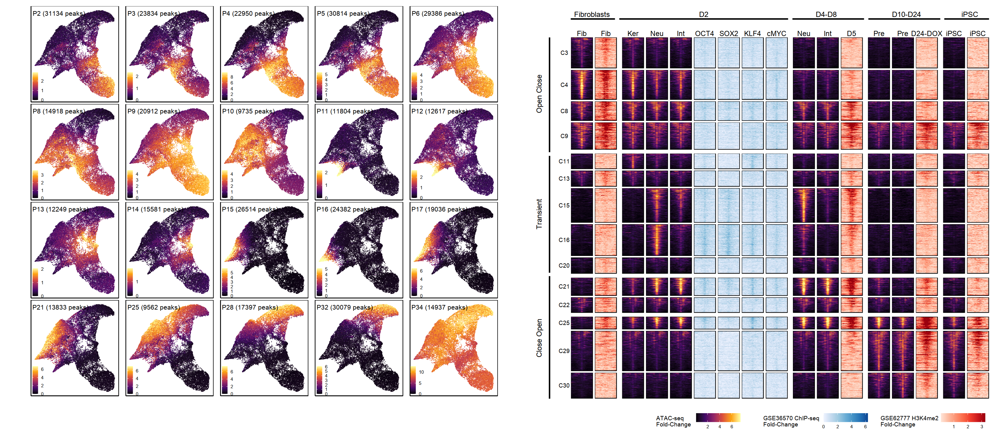

In [66]:
options(repr.plot.width = 27, repr.plot.height = 12)
row1_plots

### Row 2 (Locus + GO/REAC Terms) -- OLD

In [104]:
cluster_label_df = cluster_config

BOTTOM_PT = nrow(cluster_label_df)+0.7

cluster_label_df[nrow(cluster_label_df)+1, ] = c(nrow(cluster_label_df)+1, "", "", 1)
cluster_label_df[nrow(cluster_label_df)+1, ] = c(nrow(cluster_label_df)+1, "", "", BOTTOM_PT)

# need to play around with these parameters to find the right fit
cluster_labels_plot <- ggplot(cluster_label_df) +
    geom_text(aes(x=0, y= -as.numeric(new_cluster), label=description, hjust=1, vjust=0.5)) +
    theme_void() +
    theme(plot.margin = unit(c(0,-120,0,0), "pt"))

# add to debug- shows how ggplot dots align with genome track labels
# for (i in seq(1,18)) {
#     cluster_labels_plot = cluster_labels_plot + geom_point(x=0, y= -i)
# }

# cluster_labels_plot = cluster_labels_plot + geom_point(x=0, y= -BOTTOM_PT, colour='red')

In [116]:
row2_plots = wrap_plots(wrap_plots(
                        horizontal_spacers(cluster_labels_plot),
                        plot_spacer(),
                        horizontal_spacers(locus),
                        widths = c(1.5,0,10.5)),
                        plot_spacer(),
                        horizontal_spacers(go_terms),
                        widths=c(12,0.5,14.5))

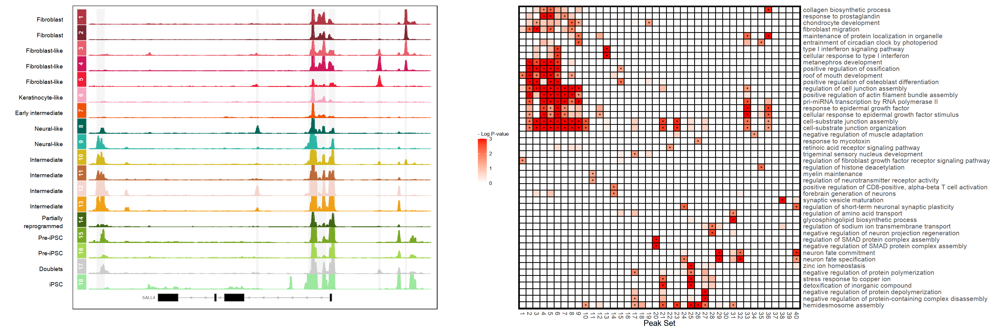

In [118]:
options(repr.plot.width = 27, repr.plot.height = 9)

row2_plots

### Row 2 (Peak -> Gene + GO)

## Assemble Master

In [67]:
main_fig = wrap_plots(row1_plots, 
                      p2g_go, 
                      ncol=1, heights=c(12,12))

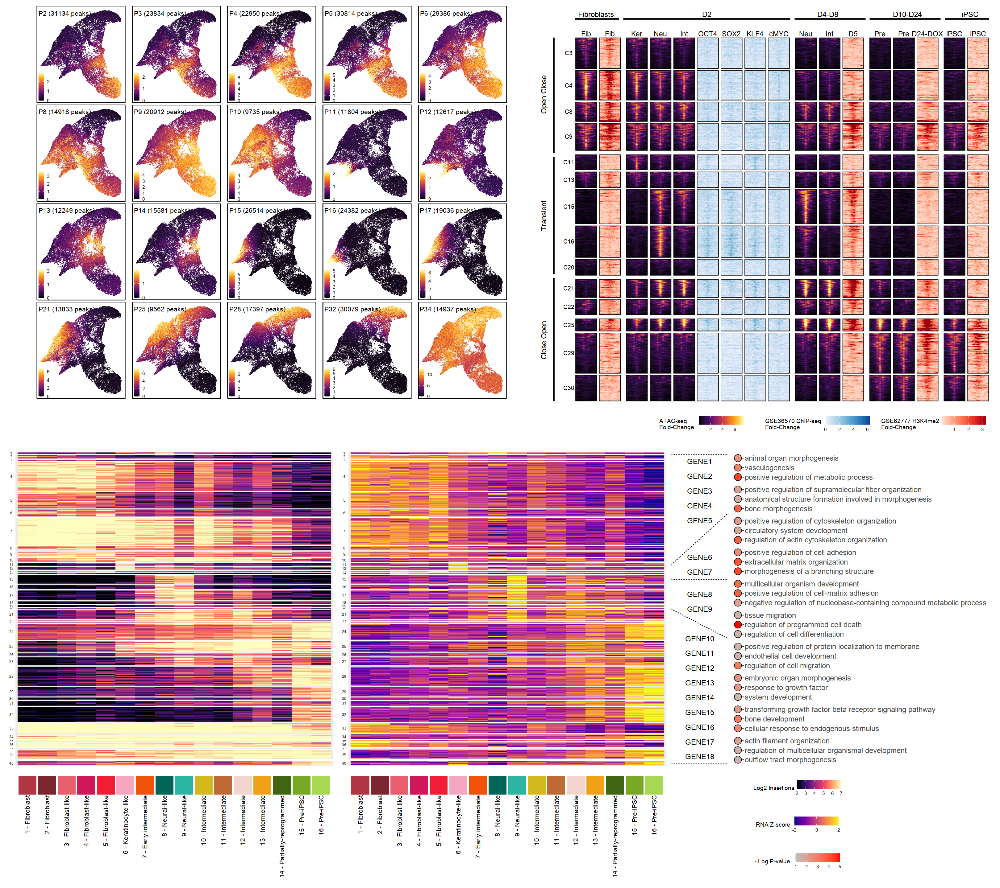

In [68]:
options(repr.plot.width = 27, repr.plot.height = 24)
main_fig

In [59]:
ggsave("./tmp.pdf", main_fig, width=27, height=24)

In [62]:
ggsave("./tmp.jpeg", dpi=300, main_fig, width=27, height=24)